In [30]:
# importing necessary libaries 

import h5py
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from sklearn.preprocessing import StandardScaler

In [31]:
# collecting the dataset file path
file_path = r'C:\Users\D\Documents\ni_range_dataset.h5'

In [32]:
# reading the hdf file 
with h5py.File(file_path, 'r') as f:
    print("File structure:")
    for key in f.keys():
        print(f"- {key}: {f[key].shape if hasattr(f[key], 'shape') else 'Group'}")

File structure:
- amplitude: (500, 64, 64, 64)
- defect_type: (500,)
- intensity: (500, 64, 64, 64)
- num_facets: (500,)
- phase: (500, 64, 64, 64)
- shape_type: (500,)
- size: (500,)
- xyz_file: (500,)


In [33]:
# loading the dataset at once

with h5py.File(file_path, 'r') as f:
    amplitude = f['amplitude'][:]
    intensity = f['intensity'][:]
    phase = f['phase'][:]
    defect_type = f['defect_type'][:]
    shape_type = f['shape_type'][:]
    size = f['size'][:]
    num_facets = f['num_facets'][:]
    xyz_file = f['xyz_file'][:]
print("Data loaded successfully!")

Data loaded successfully!


In [34]:
# viewing an instance of the amplitude slice
    
instance_0 = amplitude[0]  # Shape: (64, 64, 64)
    
print(f"Instance 0 shape: {instance_0.shape}")
print(f"Min value: {instance_0.min()}")
print(f"Max value: {instance_0.max()}")
print(f"Mean value: {instance_0.mean()}")
    

Instance 0 shape: (64, 64, 64)
Min value: 1.3190701793064363e-05
Max value: 1617.5096435546875
Mean value: 4.542590141296387


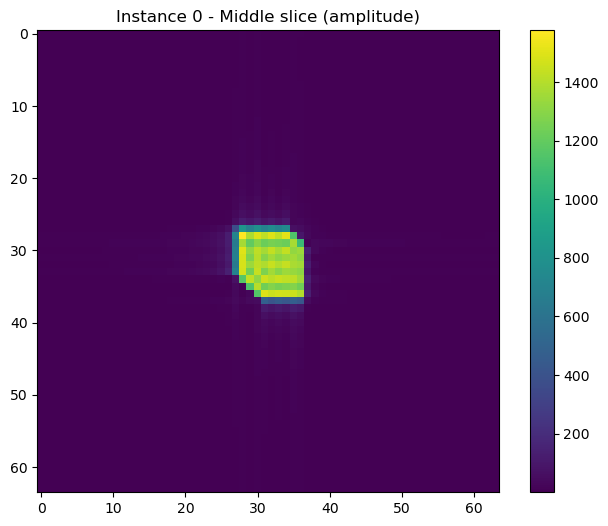

In [35]:
# View middle slice
plt.figure(figsize=(8, 6))
plt.imshow(instance_0[32], cmap='viridis')  # Middle slice
plt.title('Instance 0 - Middle slice (amplitude)')
plt.colorbar()
plt.show()

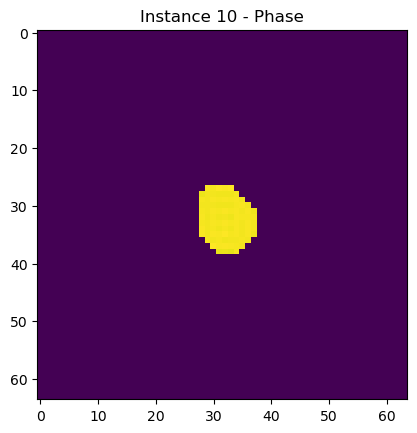

In [36]:
instance_10 = phase[10]
plt.imshow(instance_10[32], cmap='viridis')
plt.title('Instance 10 - Phase')
plt.show()

In [37]:
# function to view crystal sample

def view_crystal(instance_idx):
    """Quick function to view any crystal instance"""
    if instance_idx >= len(amplitude):
        print(f"Instance {instance_idx} doesn't exist. Max is {len(amplitude)-1}")
        return
    
    print(f"\nCrystal {instance_idx}:")
    print(f"- Defect type: {defect_type[instance_idx]}")
    print(f"- Shape type: {shape_type[instance_idx]}")
    print(f"- Size: {size[instance_idx]}")
    
    plt.figure(figsize=(15, 4))
    
    
    plt.subplot(1, 3, 1)
    plt.imshow(amplitude[instance_idx][32], cmap='viridis')
    plt.title('Amplitude')
    plt.colorbar()
    
    plt.subplot(1, 3, 2)
    plt.imshow(intensity[instance_idx][32], cmap='hot')
    plt.title('Intensity')
    plt.colorbar()
    
    plt.subplot(1, 3, 3)
    plt.imshow(phase[instance_idx][32], cmap='plasma')
    plt.title('Phase')
    plt.colorbar()
    
    plt.tight_layout()
    plt.show()




Crystal 5:
- Defect type: b'None'
- Shape type: b'clipped'
- Size: 27.500091552734375


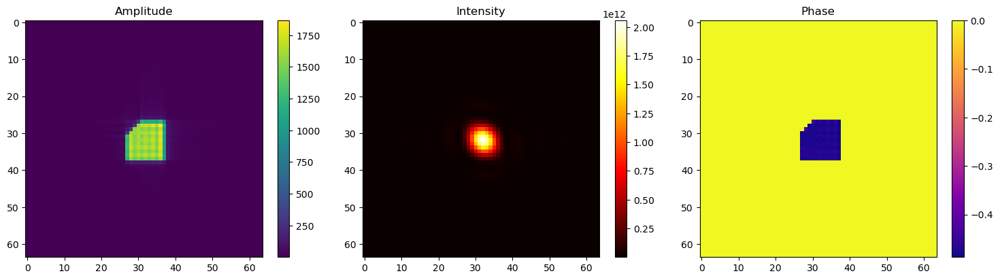

In [38]:
view_crystal(5)


Crystal 123:
- Defect type: b'None'
- Shape type: b'clipped'
- Size: 26.450389862060547


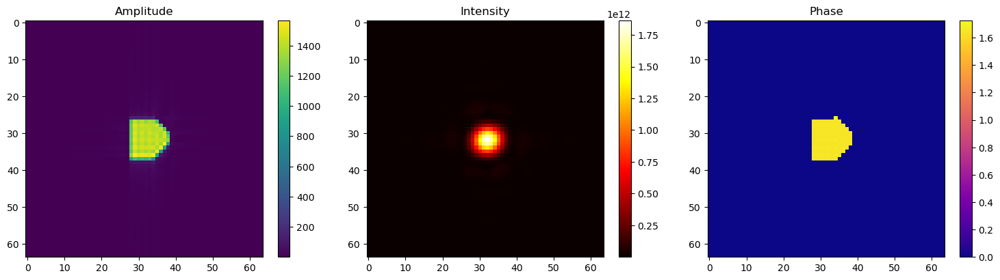

In [39]:
view_crystal(123)

Viewing crystal 123, slice 20
Metadata: defect=b'None', size=26.450389862060547


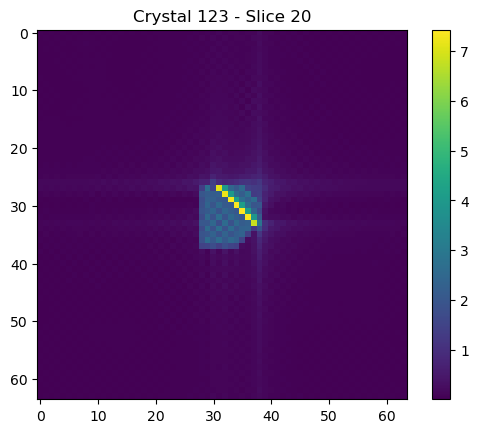

In [40]:
crystal_num = 123
slice_num = 20

print(f"Viewing crystal {crystal_num}, slice {slice_num}")
print(f"Metadata: defect={defect_type[crystal_num]}, size={size[crystal_num]}")

plt.imshow(amplitude[crystal_num][slice_num], cmap='viridis')
plt.title(f'Crystal {crystal_num} - Slice {slice_num}')
plt.colorbar()
plt.show()


Crystal 78:
- Defect type: b'None'
- Shape type: b'clipped'
- Size: 28.571731567382812


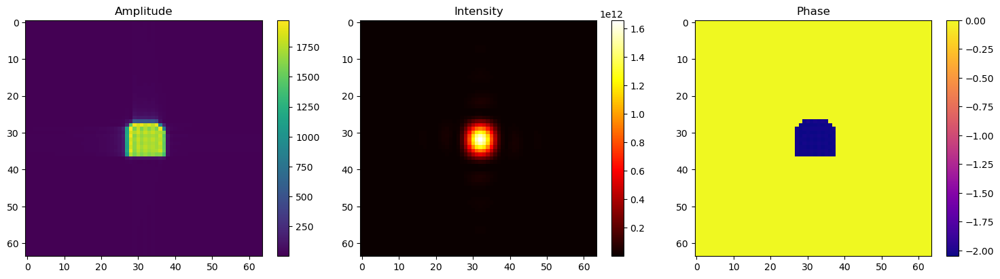

In [41]:
view_crystal(78)

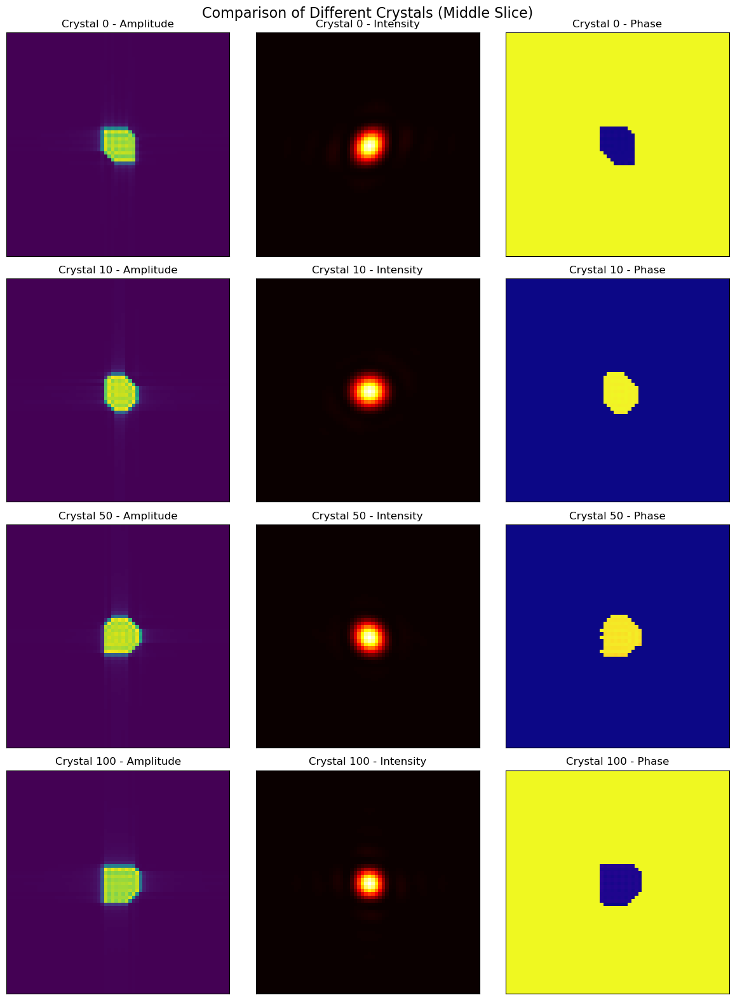

In [42]:
# Comparing 4 different crystals
instances = [0, 10, 50, 100]

fig, axes = plt.subplots(4, 3, figsize=(12, 16))
fig.suptitle('Comparison of Different Crystals (Middle Slice)', fontsize=16)

for i, idx in enumerate(instances):
    # Amplitude
    axes[i, 0].imshow(amplitude[idx][32], cmap='viridis')
    axes[i, 0].set_title(f'Crystal {idx} - Amplitude')
    
    # Intensity  
    axes[i, 1].imshow(intensity[idx][32], cmap='hot')
    axes[i, 1].set_title(f'Crystal {idx} - Intensity')
    
    # Phase
    axes[i, 2].imshow(phase[idx][32], cmap='plasma')
    axes[i, 2].set_title(f'Crystal {idx} - Phase')
    
    # Remove ticks
    for j in range(3):
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])

plt.tight_layout()
plt.show()

In [43]:
def view_3d_interactive(crystal_idx, data_type='amplitude', threshold_percentile=85):
    """
    Interactive 3D visualization using Plotly
    """
    # Select data type
    if data_type == 'amplitude':
        data = amplitude[crystal_idx]
    elif data_type == 'intensity':
        data = intensity[crystal_idx]
    elif data_type == 'phase':
        data = phase[crystal_idx]
    
    # Find voxels above threshold
    threshold = np.percentile(data, threshold_percentile)
    high_value_coords = np.where(data > threshold)
    
    # Get coordinates and values
    x, y, z = high_value_coords
    values = data[high_value_coords]
    
    # Create interactive 3D scatter plot
    fig = go.Figure(data=go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=3,
            color=values,
            colorscale='Viridis',
            opacity=0.6,
            colorbar=dict(title=data_type.title())
        ),
        text=[f'Value: {v:.3f}' for v in values],
        hovertemplate='<b>Coordinates:</b> (%{x}, %{y}, %{z})<br>' +
                      '<b>Value:</b> %{text}<extra></extra>'
    ))
    
    fig.update_layout(
        title=f'Crystal {crystal_idx} - Interactive 3D {data_type.title()}',
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            camera=dict(eye=dict(x=1.5, y=1.5, z=1.5))
        ),
        width=800,
        height=600
    )
    
    fig.show()

print("3D visualization function loaded successfully!")

3D visualization function loaded successfully!


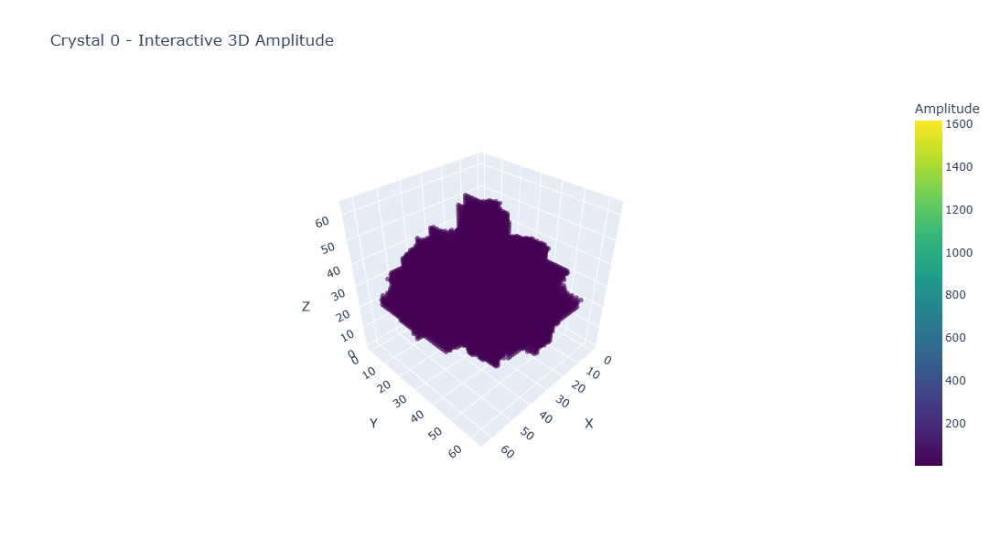

In [44]:
view_3d_interactive(0, 'amplitude')

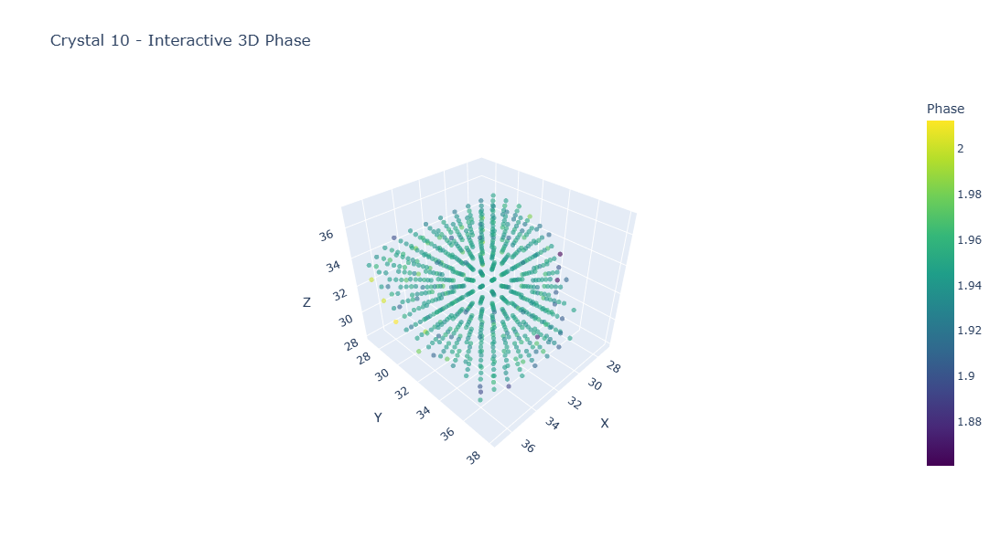

In [45]:
view_3d_interactive(10, 'phase')

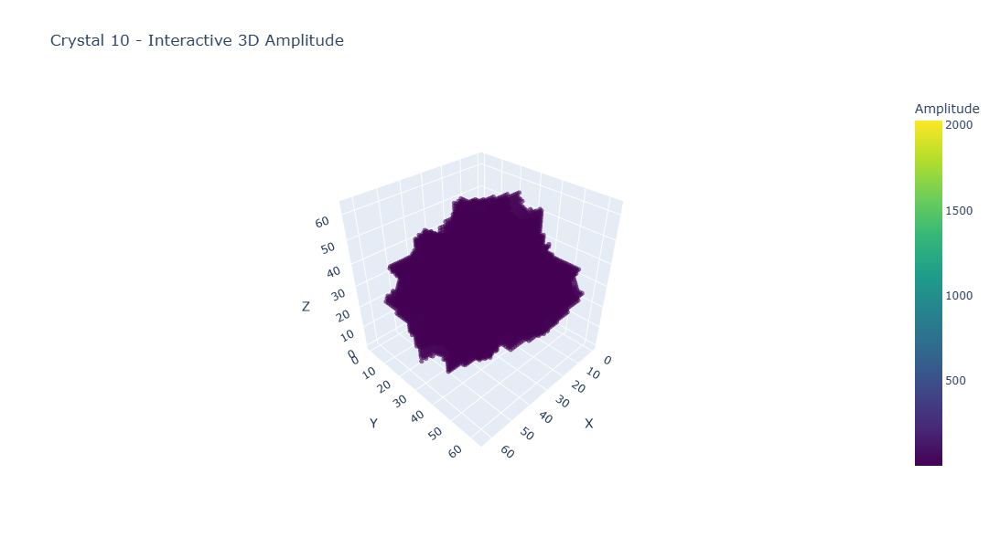

In [46]:
view_3d_interactive(10, 'amplitude')

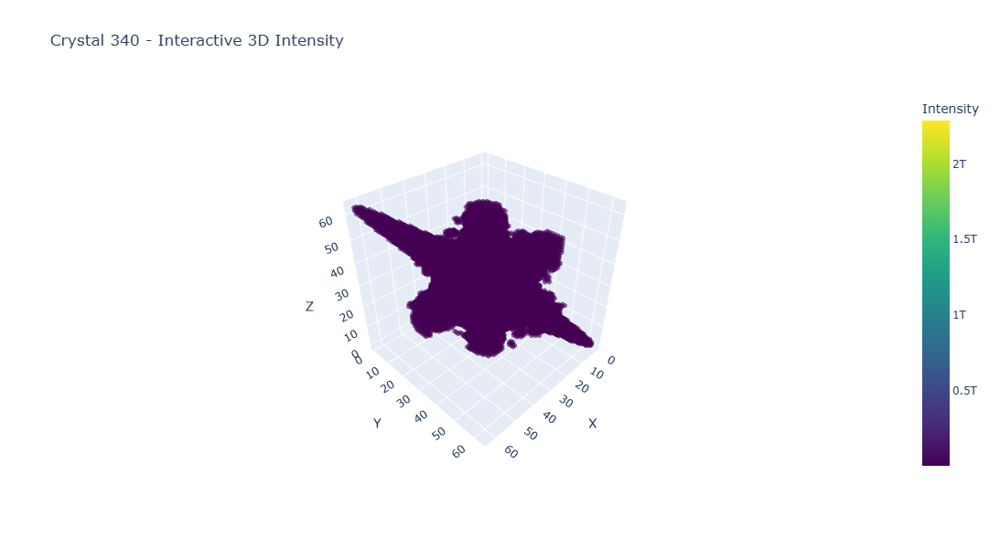

In [47]:
view_3d_interactive(340, 'intensity')

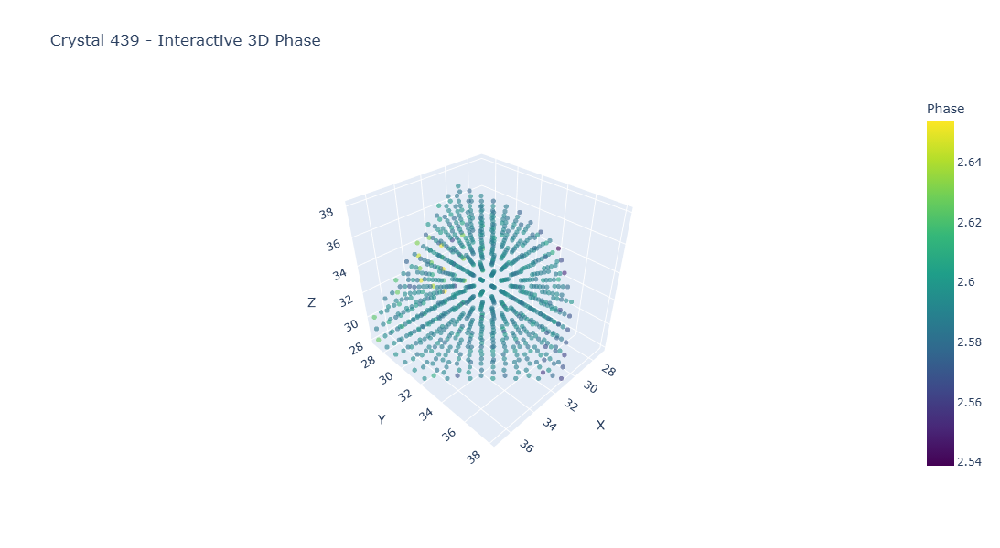

In [48]:
view_3d_interactive(439, 'phase')

In [49]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cpu


In [50]:
# Custom Dataset Class
class CrystalDataset(Dataset):
    def __init__(self, diffraction_data, amplitude_data, transform=None):
        """
        Args:
            diffraction_data: Input diffraction patterns (N, 64, 64, 64)
            amplitude_data: Target amplitude data (N, 64, 64, 64)
            transform: Optional transform to be applied
        """
        self.diffraction_data = torch.FloatTensor(diffraction_data)
        self.amplitude_data = torch.FloatTensor(amplitude_data)
        self.transform = transform
        
    def __len__(self):
        return len(self.diffraction_data)
    
    def __getitem__(self, idx):
        diffraction = self.diffraction_data[idx]
        amplitude = self.amplitude_data[idx]
        
        if self.transform:
            diffraction = self.transform(diffraction)
            amplitude = self.transform(amplitude)
            
        # Add channel dimension: (C, D, H, W) format
        diffraction = diffraction.unsqueeze(0)  # (1, 64, 64, 64)
        amplitude = amplitude.unsqueeze(0)      # (1, 64, 64, 64)
        
        return diffraction, amplitude

In [51]:
# Fixed 3D CNN Architecture
class Crystal3DCNN(nn.Module):
    def __init__(self):
        super(Crystal3DCNN, self).__init__()
        
        # Encoder (Downsampling path)
        self.encoder1 = self._make_encoder_block(1, 32)    # 64->64
        self.encoder2 = self._make_encoder_block(32, 64)   # 64->32
        self.encoder3 = self._make_encoder_block(64, 128)  # 32->16
        self.encoder4 = self._make_encoder_block(128, 256) # 16->8
        
        # Bottleneck
        self.bottleneck = self._make_encoder_block(256, 512) # 8->4
        
        # Decoder (Upsampling path) - FIXED CHANNEL COUNTS
        self.decoder4 = self._make_decoder_block(512 + 256, 256) # 768->256 (concatenated)
        self.decoder3 = self._make_decoder_block(256 + 128, 128) # 384->128 (concatenated)
        self.decoder2 = self._make_decoder_block(128 + 64, 64)   # 192->64  (concatenated)
        self.decoder1 = self._make_decoder_block(64 + 32, 32)    # 96->32   (concatenated)
        
        # Final output layer
        self.final_conv = nn.Conv3d(32, 1, kernel_size=1)
        
        # Max pooling and upsampling
        self.pool = nn.MaxPool3d(2, 2)
        self.upsample = nn.Upsample(scale_factor=2, mode='trilinear', align_corners=True)
        
    def _make_encoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def _make_decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Encoder path
        enc1 = self.encoder1(x)         # (32, 64, 64, 64)
        enc1_pool = self.pool(enc1)     # (32, 32, 32, 32)
        
        enc2 = self.encoder2(enc1_pool) # (64, 32, 32, 32)
        enc2_pool = self.pool(enc2)     # (64, 16, 16, 16)
        
        enc3 = self.encoder3(enc2_pool) # (128, 16, 16, 16)
        enc3_pool = self.pool(enc3)     # (128, 8, 8, 8)
        
        enc4 = self.encoder4(enc3_pool) # (256, 8, 8, 8)
        enc4_pool = self.pool(enc4)     # (256, 4, 4, 4)
        
        # Bottleneck
        bottleneck = self.bottleneck(enc4_pool) # (512, 4, 4, 4)
        
        # Decoder path with skip connections - FIXED
        dec4 = self.upsample(bottleneck)        # (512, 8, 8, 8)
        dec4 = torch.cat([dec4, enc4], dim=1)   # (512+256=768, 8, 8, 8)
        dec4 = self.decoder4(dec4)              # (256, 8, 8, 8)
        
        dec3 = self.upsample(dec4)              # (256, 16, 16, 16)
        dec3 = torch.cat([dec3, enc3], dim=1)   # (256+128=384, 16, 16, 16)
        dec3 = self.decoder3(dec3)              # (128, 16, 16, 16)
        
        dec2 = self.upsample(dec3)              # (128, 32, 32, 32)
        dec2 = torch.cat([dec2, enc2], dim=1)   # (128+64=192, 32, 32, 32)
        dec2 = self.decoder2(dec2)              # (64, 32, 32, 32)
        
        dec1 = self.upsample(dec2)              # (64, 64, 64, 64)
        dec1 = torch.cat([dec1, enc1], dim=1)   # (64+32=96, 64, 64, 64)
        dec1 = self.decoder1(dec1)              # (32, 64, 64, 64)
        
        # Final output
        output = self.final_conv(dec1)          # (1, 64, 64, 64)
        
        return output

In [52]:
# Lighter version for CPU training
class LightCrystal3DCNN(nn.Module):
    """Lighter 3D CNN for CPU training or limited memory"""
    def __init__(self):
        super(LightCrystal3DCNN, self).__init__()
        
        # Encoder - fewer channels
        self.encoder1 = self._make_encoder_block(1, 16)    # 64->64
        self.encoder2 = self._make_encoder_block(16, 32)   # 64->32
        self.encoder3 = self._make_encoder_block(32, 64)   # 32->16
        
        # Bottleneck
        self.bottleneck = self._make_encoder_block(64, 128) # 16->8
        
        # Decoder
        self.decoder3 = self._make_decoder_block(128 + 64, 64)  # 192->64
        self.decoder2 = self._make_decoder_block(64 + 32, 32)   # 96->32
        self.decoder1 = self._make_decoder_block(32 + 16, 16)   # 48->16
        
        # Final output
        self.final_conv = nn.Conv3d(16, 1, kernel_size=1)
        
        # Pooling and upsampling
        self.pool = nn.MaxPool3d(2, 2)
        self.upsample = nn.Upsample(scale_factor=2, mode='trilinear', align_corners=True)
        
    def _make_encoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def _make_decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)         # (16, 64, 64, 64)
        enc1_pool = self.pool(enc1)     # (16, 32, 32, 32)
        
        enc2 = self.encoder2(enc1_pool) # (32, 32, 32, 32)
        enc2_pool = self.pool(enc2)     # (32, 16, 16, 16)
        
        enc3 = self.encoder3(enc2_pool) # (64, 16, 16, 16)
        enc3_pool = self.pool(enc3)     # (64, 8, 8, 8)
        
        # Bottleneck
        bottleneck = self.bottleneck(enc3_pool) # (128, 8, 8, 8)
        
        # Decoder
        dec3 = self.upsample(bottleneck)        # (128, 16, 16, 16)
        dec3 = torch.cat([dec3, enc3], dim=1)   # (128+64=192, 16, 16, 16)
        dec3 = self.decoder3(dec3)              # (64, 16, 16, 16)
        
        dec2 = self.upsample(dec3)              # (64, 32, 32, 32)
        dec2 = torch.cat([dec2, enc2], dim=1)   # (64+32=96, 32, 32, 32)
        dec2 = self.decoder2(dec2)              # (32, 32, 32, 32)
        
        dec1 = self.upsample(dec2)              # (32, 64, 64, 64)
        dec1 = torch.cat([dec1, enc1], dim=1)   # (32+16=48, 64, 64, 64)
        dec1 = self.decoder1(dec1)              # (16, 64, 64, 64)
        
        # Final output
        output = self.final_conv(dec1)          # (1, 64, 64, 64)
        
        return output

In [53]:
# CPU-optimized training function
def train_model_cpu(model, train_loader, val_loader, num_epochs=20, learning_rate=1e-3):
    """CPU-optimized training function"""
    device = torch.device('cpu')
    model = model.to(device)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)
    
    train_losses = []
    val_losses = []
    
    print(f"Training on {device}")
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        
        for batch_idx, (data, target) in enumerate(train_loader):
            data, target = data.to(device), target.to(device)
            
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            
            if batch_idx % 50 == 0:
                print(f'Epoch {epoch+1}/{num_epochs}, Batch {batch_idx+1}, Loss: {loss.item():.6f}')
        
        avg_train_loss = train_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        
        # Validation phase
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for data, target in val_loader:
                data, target = data.to(device), target.to(device)
                output = model(data)
                loss = criterion(output, target)
                val_loss += loss.item()
        
        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        
        scheduler.step(avg_val_loss)
        
        print(f'Epoch {epoch+1}/{num_epochs}: Train Loss: {avg_train_loss:.6f}, Val Loss: {avg_val_loss:.6f}')
        print('-' * 60)
    
    return train_losses, val_losses
    

In [54]:
# Quick test function
def test_model_architecture():
    """Test if the model architecture works"""
    print("Testing model architectures...")
    
    # Test full model
    try:
        model = Crystal3DCNN()
        test_input = torch.randn(1, 1, 64, 64, 64)
        output = model(test_input)
        print(f"✅ Full model works: {test_input.shape} -> {output.shape}")
        
        total_params = sum(p.numel() for p in model.parameters())
        print(f"Full model parameters: {total_params:,} ({total_params * 4 / (1024**2):.1f} MB)")
    except Exception as e:
        print(f"❌ Full model failed: {e}")
    
    # Test light model
    try:
        light_model = LightCrystal3DCNN()
        test_input = torch.randn(1, 1, 64, 64, 64)
        output = light_model(test_input)
        print(f"✅ Light model works: {test_input.shape} -> {output.shape}")
        
        total_params = sum(p.numel() for p in light_model.parameters())
        print(f"Light model parameters: {total_params:,} ({total_params * 4 / (1024**2):.1f} MB)")
    except Exception as e:
        print(f"❌ Light model failed: {e}")

In [55]:
# Data preparation function (simplified)
def prepare_data_simple(diffraction_data, amplitude_data, batch_size=2, val_split=0.2):
    """Simple data preparation without normalization issues"""
    
    print("Preparing data...")
    
    # Convert to tensors
    X = torch.FloatTensor(diffraction_data)
    y = torch.FloatTensor(amplitude_data)
    
    # Add channel dimension: (N, 64, 64, 64) -> (N, 1, 64, 64, 64)
    X = X.unsqueeze(1)
    y = y.unsqueeze(1)
    
    print(f"Data shapes: X={X.shape}, y={y.shape}")
    
    # Simple normalization
    X = (X - X.mean()) / (X.std() + 1e-8)
    y = (y - y.mean()) / (y.std() + 1e-8)
    
    # Create dataset
    dataset = TensorDataset(X, y)
    
    # Split dataset
    val_size = int(val_split * len(dataset))
    train_size = len(dataset) - val_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    
    print(f"Training samples: {len(train_dataset)}, Validation samples: {len(val_dataset)}")
    
    return train_loader, val_loader



In [56]:
# Visualization function
def visualize_prediction(model, intensity_data, amplitude_data, crystal_idx=0):
    """Visualize model predictions vs ground truth"""
    model.eval()
    device = next(model.parameters()).device
    
    with torch.no_grad():
        # Prepare input
        input_tensor = torch.FloatTensor(intensity_data[crystal_idx:crystal_idx+1]).unsqueeze(1).to(device)
        input_tensor = (input_tensor - input_tensor.mean()) / (input_tensor.std() + 1e-8)
        
        # Get prediction
        prediction = model(input_tensor)
        prediction = prediction.cpu().numpy()[0, 0]  # Remove batch and channel dims
        
    ground_truth = amplitude_data[crystal_idx]
    
    # Show middle slices
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))
    slice_idx = 32  # Middle slice
    
    # Ground truth
    im1 = axes[0, 0].imshow(ground_truth[slice_idx], cmap='viridis')
    axes[0, 0].set_title('Ground Truth - XY slice')
    plt.colorbar(im1, ax=axes[0, 0])
    
    im2 = axes[0, 1].imshow(ground_truth[:, slice_idx, :], cmap='viridis')
    axes[0, 1].set_title('Ground Truth - XZ slice')
    plt.colorbar(im2, ax=axes[0, 1])
    
    im3 = axes[0, 2].imshow(ground_truth[:, :, slice_idx], cmap='viridis')
    axes[0, 2].set_title('Ground Truth - YZ slice')
    plt.colorbar(im3, ax=axes[0, 2])
    
    # Prediction
    im4 = axes[1, 0].imshow(prediction[slice_idx], cmap='viridis')
    axes[1, 0].set_title('Prediction - XY slice')
    plt.colorbar(im4, ax=axes[1, 0])
    
    im5 = axes[1, 1].imshow(prediction[:, slice_idx, :], cmap='viridis')
    axes[1, 1].set_title('Prediction - XZ slice')
    plt.colorbar(im5, ax=axes[1, 1])
    
    im6 = axes[1, 2].imshow(prediction[:, :, slice_idx], cmap='viridis')
    axes[1, 2].set_title('Prediction - YZ slice')
    plt.colorbar(im6, ax=axes[1, 2])
    
    for ax in axes.flat:
        ax.set_xticks([])
        ax.set_yticks([])
    
    plt.tight_layout()
    plt.show()
    
    # Calculate error metrics
    mse = np.mean((prediction - ground_truth)**2)
    mae = np.mean(np.abs(prediction - ground_truth))
    
    print(f"Crystal {crystal_idx} - MSE: {mse:.6f}, MAE: {mae:.6f}")

In [57]:
# Test the architecture first
if __name__ == "__main__":
    test_model_architecture()

Testing model architectures...
✅ Full model works: torch.Size([1, 1, 64, 64, 64]) -> torch.Size([1, 1, 64, 64, 64])
Full model parameters: 23,538,177 (89.8 MB)
✅ Light model works: torch.Size([1, 1, 64, 64, 64]) -> torch.Size([1, 1, 64, 64, 64])
Light model parameters: 1,460,993 (5.6 MB)


In [58]:
# Test the fixed architecture first
test_model_architecture()

Testing model architectures...
✅ Full model works: torch.Size([1, 1, 64, 64, 64]) -> torch.Size([1, 1, 64, 64, 64])
Full model parameters: 23,538,177 (89.8 MB)
✅ Light model works: torch.Size([1, 1, 64, 64, 64]) -> torch.Size([1, 1, 64, 64, 64])
Light model parameters: 1,460,993 (5.6 MB)


In [59]:
# Since you don't have GPU, use the lighter model
model = LightCrystal3DCNN()

# Or if you want to try the full model on CPU
# model = Crystal3DCNN()

print(f"Model parameters: {sum(p.numel() for p in model.parameters()):,}")

Model parameters: 1,460,993


In [62]:
from torch.utils.data import TensorDataset

# Use the simplified data preparation
train_loader, val_loader = prepare_data_simple(
    diffraction_data=intensity,  # Your intensity data
    amplitude_data=amplitude,    # Your amplitude data
    batch_size=1,               # Start small for CPU
    val_split=0.2
)

Preparing data...
Data shapes: X=torch.Size([500, 1, 64, 64, 64]), y=torch.Size([500, 1, 64, 64, 64])
Training samples: 400, Validation samples: 100


In [63]:
# Train on CPU
train_losses, val_losses = train_model_cpu(
    model,
    train_loader,
    val_loader,
    num_epochs=10,  # Start small
    learning_rate=1e-3
)

Training on cpu
Epoch 1/10, Batch 1, Loss: 2.057420
Epoch 1/10, Batch 51, Loss: 1.667032
Epoch 1/10, Batch 101, Loss: 0.373210
Epoch 1/10, Batch 151, Loss: 0.181694
Epoch 1/10, Batch 201, Loss: 0.183055
Epoch 1/10, Batch 251, Loss: 0.155162
Epoch 1/10, Batch 301, Loss: 0.129355
Epoch 1/10, Batch 351, Loss: 0.186777
Epoch 1/10: Train Loss: 0.296275, Val Loss: 0.425139
------------------------------------------------------------
Epoch 2/10, Batch 1, Loss: 0.131859
Epoch 2/10, Batch 51, Loss: 0.219640
Epoch 2/10, Batch 101, Loss: 0.132517
Epoch 2/10, Batch 151, Loss: 0.118177
Epoch 2/10, Batch 201, Loss: 0.190771
Epoch 2/10, Batch 251, Loss: 0.567685
Epoch 2/10, Batch 301, Loss: 0.205339
Epoch 2/10, Batch 351, Loss: 0.169818
Epoch 2/10: Train Loss: 0.241984, Val Loss: 0.194415
------------------------------------------------------------
Epoch 3/10, Batch 1, Loss: 0.140270
Epoch 3/10, Batch 51, Loss: 0.201598
Epoch 3/10, Batch 101, Loss: 0.280994
Epoch 3/10, Batch 151, Loss: 0.139667
Epoch

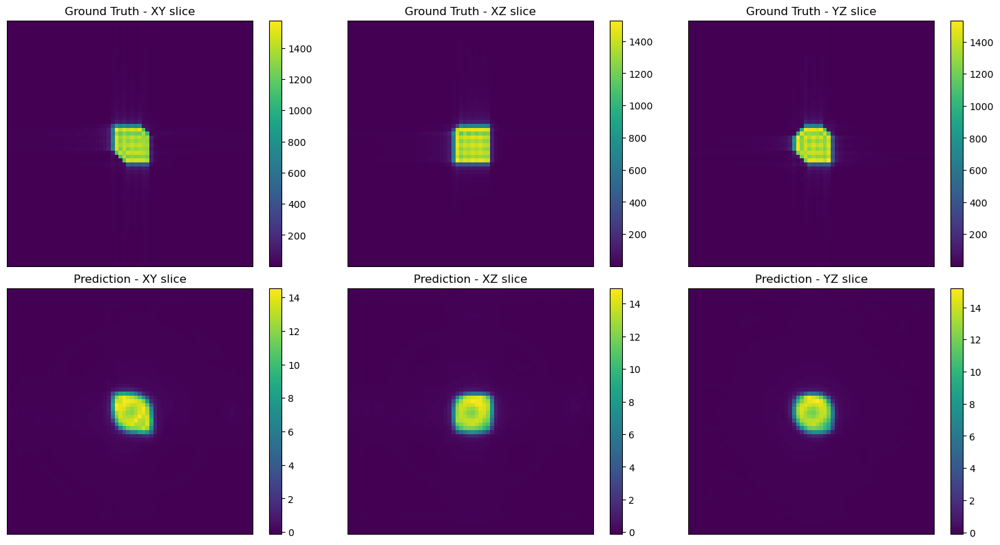

Crystal 0 - MSE: 4550.534668, MAE: 4.573351


In [65]:
# Visualize predictions
visualize_prediction(model, intensity, amplitude, crystal_idx=0)

In [66]:
train_loader, val_loader = prepare_data_simple(
    diffraction_data=intensity,
    amplitude_data=amplitude,
    batch_size=1,
    val_split=0.2
)

model = LightCrystal3DCNN()  # Use the light model for CPU

train_losses, val_losses = train_model_cpu(
    model,
    train_loader,
    val_loader,
    num_epochs=10,  # You can increase this later
    learning_rate=1e-3
)

Preparing data...
Data shapes: X=torch.Size([500, 1, 64, 64, 64]), y=torch.Size([500, 1, 64, 64, 64])
Training samples: 400, Validation samples: 100
Training on cpu
Epoch 1/10, Batch 1, Loss: 0.434027
Epoch 1/10, Batch 51, Loss: 0.414747
Epoch 1/10, Batch 101, Loss: 0.210244
Epoch 1/10, Batch 151, Loss: 0.359840
Epoch 1/10, Batch 201, Loss: 0.143394
Epoch 1/10, Batch 251, Loss: 0.253262
Epoch 1/10, Batch 301, Loss: 0.557177
Epoch 1/10, Batch 351, Loss: 0.124061
Epoch 1/10: Train Loss: 0.264238, Val Loss: 0.255936
------------------------------------------------------------
Epoch 2/10, Batch 1, Loss: 0.151502
Epoch 2/10, Batch 51, Loss: 0.154082
Epoch 2/10, Batch 101, Loss: 0.356680
Epoch 2/10, Batch 151, Loss: 0.186751
Epoch 2/10, Batch 201, Loss: 0.480064
Epoch 2/10, Batch 251, Loss: 0.150908
Epoch 2/10, Batch 301, Loss: 0.915270
Epoch 2/10, Batch 351, Loss: 0.205155
Epoch 2/10: Train Loss: 0.221884, Val Loss: 1.072659
------------------------------------------------------------
Epoch

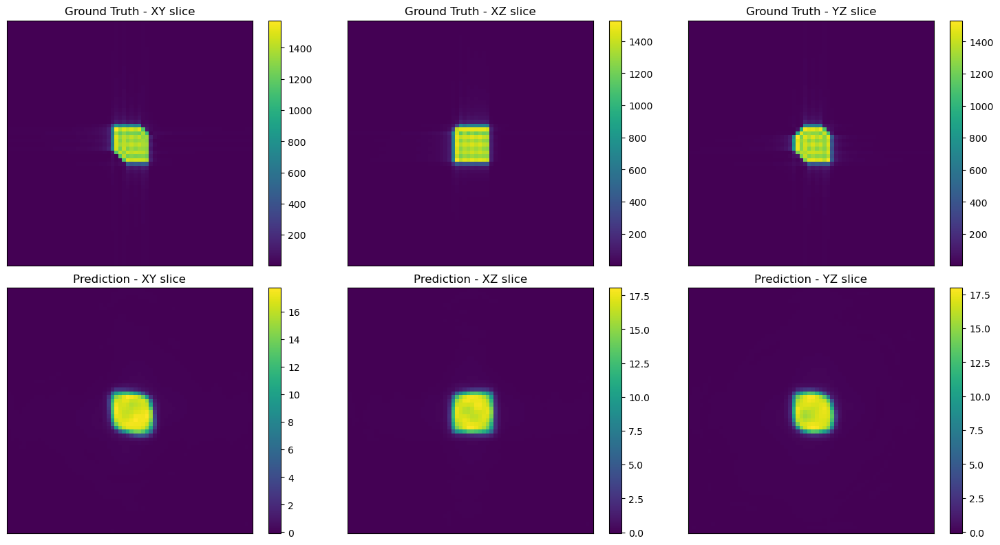

Crystal 0 - MSE: 4518.219727, MAE: 4.536309


In [67]:
 #Visualize predictions (run after training)
visualize_prediction(model, intensity, amplitude, crystal_idx=0)

In [68]:
# Instantiate the full model (not the light version)
model = Crystal3DCNN()

# (Optional but recommended) Print the number of parameters to check model size
print(f"Model parameters: {sum(p.numel() for p in model.parameters()):,}")

# Train the model on CPU
train_losses, val_losses = train_model_cpu(
    model,
    train_loader,
    val_loader,
    num_epochs=10,        # Increase this value for longer training if your system can handle it
    learning_rate=1e-3
)

Model parameters: 23,538,177
Training on cpu
Epoch 1/10, Batch 1, Loss: 1.014574
Epoch 1/10, Batch 51, Loss: 0.144379
Epoch 1/10, Batch 101, Loss: 0.142339
Epoch 1/10, Batch 151, Loss: 0.139970
Epoch 1/10, Batch 201, Loss: 0.137956
Epoch 1/10, Batch 251, Loss: 0.139368
Epoch 1/10, Batch 301, Loss: 0.074241
Epoch 1/10, Batch 351, Loss: 0.442287
Epoch 1/10: Train Loss: 0.274322, Val Loss: 0.623101
------------------------------------------------------------
Epoch 2/10, Batch 1, Loss: 0.108479
Epoch 2/10, Batch 51, Loss: 0.151521
Epoch 2/10, Batch 101, Loss: 0.155501
Epoch 2/10, Batch 151, Loss: 0.288401
Epoch 2/10, Batch 201, Loss: 0.114741
Epoch 2/10, Batch 251, Loss: 0.150264
Epoch 2/10, Batch 301, Loss: 0.102866
Epoch 2/10, Batch 351, Loss: 0.113229
Epoch 2/10: Train Loss: 0.227747, Val Loss: 0.519084
------------------------------------------------------------
Epoch 3/10, Batch 1, Loss: 0.102358
Epoch 3/10, Batch 51, Loss: 0.405378
Epoch 3/10, Batch 101, Loss: 0.137662
Epoch 3/10, Ba

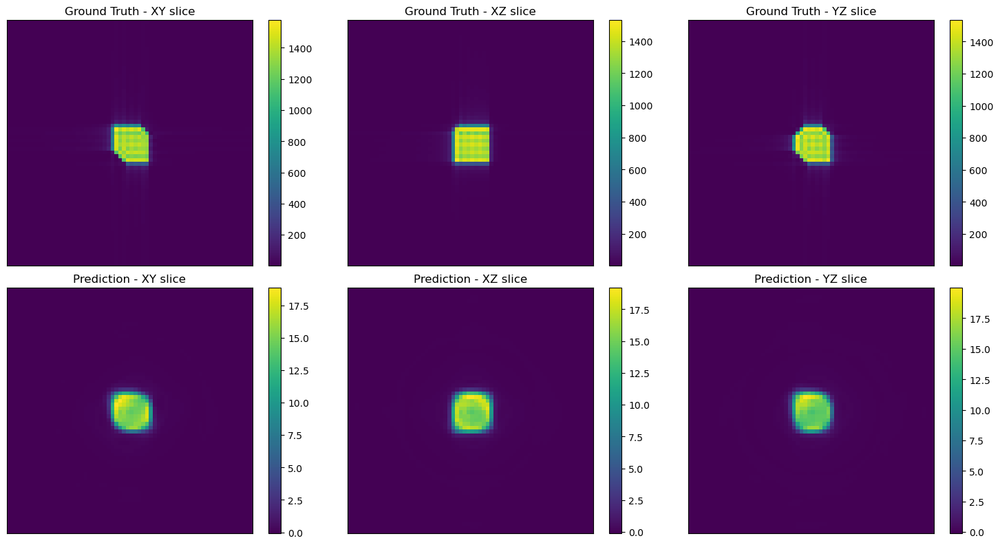

Crystal 0 - MSE: 4528.918945, MAE: 4.555776


In [69]:
visualize_prediction(model, intensity, amplitude, crystal_idx=0)